# A simplified Version of Project Lab2
## from Supplement A: Microwave Radiometer Temperature and Humidity Retrieval

In [15]:
import sys
import traceback
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pn
import xarray as xr
import scipy.stats as stats

import pyOptimalEstimation as pyOE

%matplotlib inline
sns.set(style='ticks', palette='deep')

sys.path.append('lib')
import nonScatMWRadTran
import supporting_routines

In [16]:
def forwardRT(X, pressure=None, zenithAngle=0, frequencies=[]):

    # X contains T and Q, lets split the vector
    temperature, humidity = supporting_routines.splitTQ(X)
    # humdity is in log10 scale, convert to linear in kg/kg
    humidity = (10**humidity) / 1000.
    # Height in meters comes from index of the temperature (or humidty) vector
    heights = temperature.index
    assert np.all(np.diff(heights) > 0)

    # get absolute humidty from specific humdity
    abs_humidity = supporting_routines.q2a(humidity, pressure, temperature)
    
    # run the forward operator
    TB, tau, tau_wv, tau_o2 = nonScatMWRadTran.STP_IM10(
        heights,  # [m]  
        temperature,  # [K]
        pressure,  # [Pa]
        abs_humidity,  # [kgm^-3]
        zenithAngle,  # zenith angle of observation in deg.
        frequencies,  # frequency vector in GHz
    )
    return TB

# Load prior dataset
We start with loading the the previously prepared (see [lib/prepare_radiosondes.ipynb](lib/prepare_radiosondes.ipynb)) collection of radiosonde profiles at NSA from 04/2002 to 02/2020. We use the xarray library which provides a transparent interface to netCDF files so that we can directly copy the required variables form the netCDF file. The unit of temperature is Kelvin, specific humidity is provided in g/kg, and pressure is in Pa.


In [17]:
prior = xr.open_dataset('data/radiosonde_climatology_nsa_2002-2020.nc')

prior['q'] = np.log10(prior['q'])

profileTT = np.array([
    '2004-03-16T12:00:00.000000000', '2006-04-01T00:00:00.000000000',
    '2009-01-30T18:00:00.000000000', '2014-07-27T06:00:00.000000000',
    '2018-01-08T12:00:00.000000000'
],dtype='datetime64[ns]')

Yobs_time = '2006-04-01T00:00:00.000000000'

profiles = prior.sel(time=profileTT)
prior = prior.drop_sel(time=profileTT)
nLev = len(prior.height)

priors = {'all': prior}

seasons = [
    'DJF',
    'MAM',
    'JJA',
    'SON',
]

Xa_season = 'all'

months = (
    [12, 1, 2],
    [3, 4, 5],
    [6, 7, 8],
    [9, 10, 11],
)
for season, month in zip(seasons, months):
    priors[season] = prior.where(
        np.in1d(prior['time.month'], month)[:, np.newaxis]).dropna(
            'time', how='all')
    
prior_qts = {}
for season in priors.keys():
    prior_q = priors[season]['q'].to_pandas()
    prior_q.columns = ['%05i_q' % (i) for i in prior_q.columns]
    prior_t = priors[season]['temp'].to_pandas()
    prior_t.columns = ['%05i_t' % (i) for i in prior_t.columns]
    prior_qts[season] = pn.concat((prior_q, prior_t), axis=1)
    prior_qts[season] = prior_qts[season].reindex(
        sorted(prior_qts[season].columns), axis=1)

/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.61 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  791.043
0.91 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.101
1.21 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.309
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.61 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  791.083
0.91 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.098
1.25 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.309
1.59 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.70 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  791.427
1.04 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.232
1.39 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.311
1.73 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  792.350
0.89 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.201
1.19 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.311
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  788.021
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.943
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.306
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  788.846
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.945
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.306
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  787.162
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.972
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.309
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.59 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  787.211
0.89 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.878
1.19 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.305
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  784.913
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.662
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.302
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  794.129
0.89 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.262
1.19 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.311
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.59 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  785.551
0.88 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.806
1.18 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.304
1.48 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/pyOptimalEstimation_examples/lib/supporting_routines.py:295: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (axA, axB) = plt.subplots(ncols=2, sharey=True,
/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  794.270
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.247
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.310
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  796.361
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.544
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.314
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  792.439
0.89 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.125
1.19 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.310
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  790.852
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.895
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.307
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  784.756
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.706
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.304
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  781.388
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.598
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.302
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  789.347
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.866
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.306
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.68 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  800.292
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  33.081
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.324
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  793.476
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.469
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.316
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  786.714
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.813
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.304
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  793.178
1.04 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.065
1.34 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.305
1.68 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.61 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  786.790
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.865
1.25 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.307
1.59 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  788.907
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.518
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.315
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  790.926
1.04 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.291
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.313
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.68 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  789.076
1.03 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  31.861
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.306
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.68 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  798.731
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.577
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.314
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  783.489
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.027
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.309
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  788.735
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.769
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.305
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  798.713
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.711
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.321
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.68 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  796.748
1.02 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.567
1.36 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.312
1.71 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.68 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  788.716
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.264
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.313
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  789.411
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.689
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.303
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.66 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  794.956
0.96 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.969
1.27 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.307
1.58 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.62 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  797.849
0.94 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.234
1.24 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.309
1.59 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.64 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  806.234
0.94 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  33.007
1.24 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.321
1.55 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.61 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  788.017
0.90 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  31.379
1.21 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.299
1.52 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  789.375
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.000
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.307
1.51 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.64 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  775.660
0.99 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  30.923
1.33 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.291
1.67 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  789.876
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.171
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.312
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  806.601
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.728
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.313
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  795.725
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  33.016
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.324
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  779.002
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.399
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.299
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  790.716
1.03 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  31.860
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.305
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  791.457
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.093
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.311
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.70 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  798.807
1.04 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.497
1.39 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.315
1.73 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  796.903
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.088
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.306
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  797.623
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.305
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.308
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  799.506
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.264
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.310
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  803.693
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.185
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.310
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  795.207
1.04 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.936
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.304
1.73 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  789.849
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.176
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.310
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  779.107
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  30.772
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.288
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.68 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  796.966
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.535
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.317
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  804.230
1.03 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  33.043
1.37 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.319
1.72 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  773.673
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.277
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.302
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  773.178
1.04 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.539
1.38 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.307
1.72 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.73 of 120, not converged (x-space):  790.391
1.04 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  32.914
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.324
1.73 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  791.538
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.145
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.313
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.64 s, iteration 1, degrees of freedom: 4.73 of 120, not converged (x-space):  785.850
0.99 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  31.021
1.29 s, iteration 3, degrees of freedom: 4.70 of 120, converged (x-space):  0.296
1.59 s, iteration 4, degrees of freedom: 4.70 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  787.270
0.91 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.804
1.25 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.304
1.55 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  777.636
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  30.850
1.20 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.290
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.64 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  795.121
0.98 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.989
1.32 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.321
1.66 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  802.827
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.714
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.323
1.71 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.64 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  793.386
0.93 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.581
1.24 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.301
1.54 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  802.987
0.90 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  32.547
1.20 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.312
1.50 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.59 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  785.758
0.89 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.265
1.19 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.296
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.65 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  788.120
0.99 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.522
1.33 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.313
1.67 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  838.892
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  34.681
1.37 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.340
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  780.531
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.487
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.315
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  780.742
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.759
1.34 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.309
1.64 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  829.126
0.91 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  34.972
1.21 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.349
1.51 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.002


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  791.331
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  31.651
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.309
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  797.142
0.89 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  32.033
1.19 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.308
1.49 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.65 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  793.213
0.95 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.199
1.25 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.307
1.55 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  801.898
0.89 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.453
1.19 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.307
1.48 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.59 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  801.629
0.89 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.088
1.18 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.305
1.48 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.59 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  836.109
0.89 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  34.859
1.18 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.343
1.48 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.59 s, iteration 1, degrees of freedom: 4.73 of 120, not converged (x-space):  814.789
0.89 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  33.482
1.18 s, iteration 3, degrees of freedom: 4.70 of 120, converged (x-space):  0.332
1.48 s, iteration 4, degrees of freedom: 4.70 of 120, done.  0.002


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.59 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  778.530
0.89 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  30.659
1.19 s, iteration 3, degrees of freedom: 4.67 of 120, converged (x-space):  0.280
1.49 s, iteration 4, degrees of freedom: 4.67 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  806.093
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  34.401
1.24 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.336
1.58 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  779.492
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.672
1.34 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.318
1.66 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  803.511
1.03 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  33.571
1.38 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.332
1.72 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  816.396
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  33.373
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.329
1.52 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  815.929
0.89 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  32.041
1.19 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.297
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  800.644
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  33.268
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.332
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  775.429
0.89 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  30.991
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.303
1.49 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.65 s, iteration 1, degrees of freedom: 4.73 of 120, not converged (x-space):  764.949
0.99 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  32.116
1.33 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.316
1.68 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.65 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  764.049
0.94 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  29.674
1.24 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.275
1.54 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  812.338
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  35.212
1.25 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.365
1.59 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.002


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.65 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  816.214
0.94 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  34.003
1.24 s, iteration 3, degrees of freedom: 4.67 of 120, converged (x-space):  0.337
1.54 s, iteration 4, degrees of freedom: 4.67 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.61 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  755.621
0.92 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  28.985
1.22 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.259
1.53 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.65 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  787.981
0.99 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  32.036
1.29 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.302
1.63 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  751.810
1.04 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  30.442
1.34 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.302
1.64 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  845.825
0.90 s, iteration 2, degrees of freedom: 4.69 of 120, not converged (x-space):  37.468
1.20 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.387
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.002


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  852.838
0.90 s, iteration 2, degrees of freedom: 4.67 of 120, not converged (x-space):  39.548
1.19 s, iteration 3, degrees of freedom: 4.66 of 120, converged (x-space):  0.396
1.49 s, iteration 4, degrees of freedom: 4.67 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.64 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  772.751
0.99 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  30.152
1.33 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.277
1.64 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.62 s, iteration 1, degrees of freedom: 4.72 of 120, not converged (x-space):  719.834
0.92 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  29.014
1.22 s, iteration 3, degrees of freedom: 4.70 of 120, converged (x-space):  0.272
1.57 s, iteration 4, degrees of freedom: 4.70 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1206591325.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1206591325.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.61 s, iteration 1, degrees of freedom: 4.73 of 120, not converged (x-space):  847.438
0.91 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  38.222
1.21 s, iteration 3, degrees of freedom: 4.69 of 120, converged (x-space):  0.380
1.50 s, iteration 4, degrees of freedom: 4.69 of 120, done.  0.002


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)


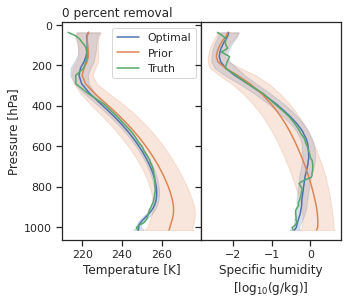

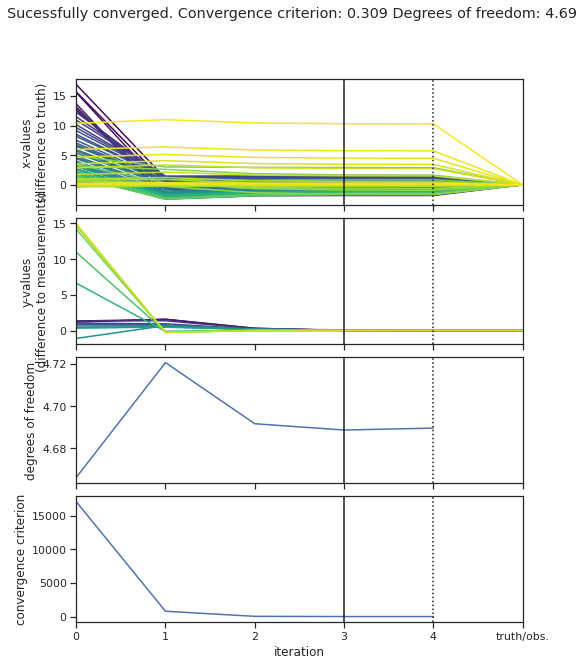

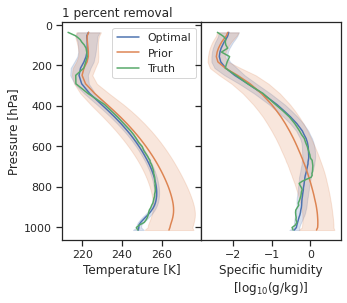

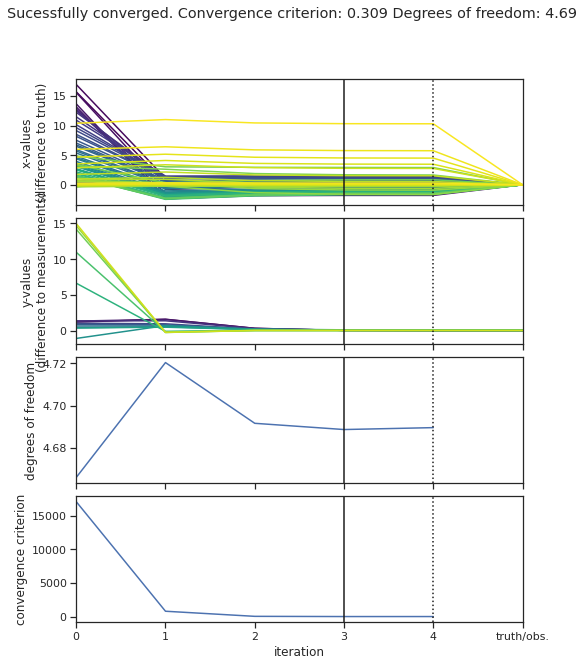

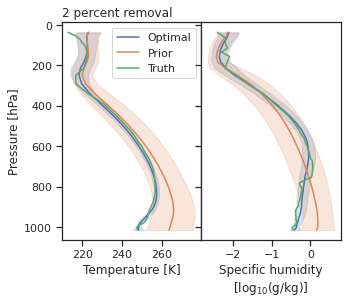

...

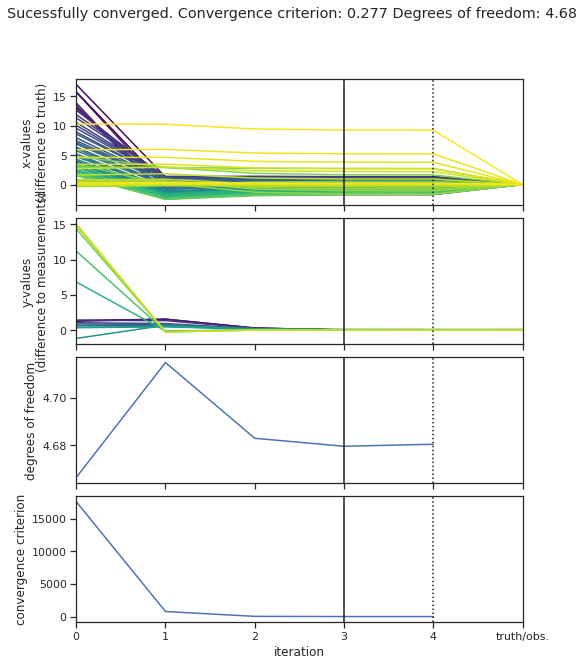

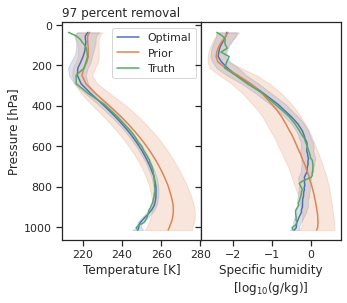

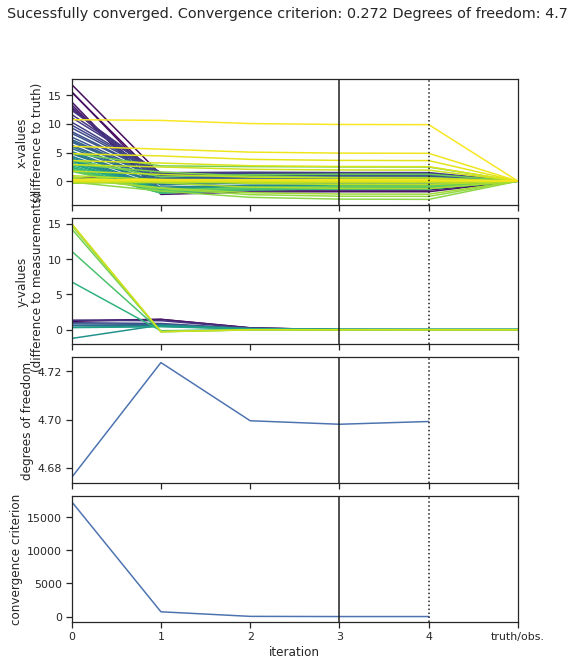

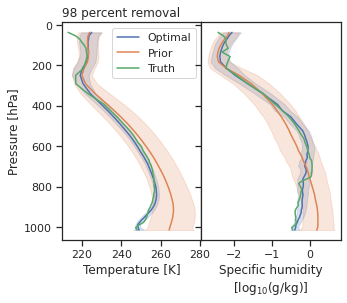

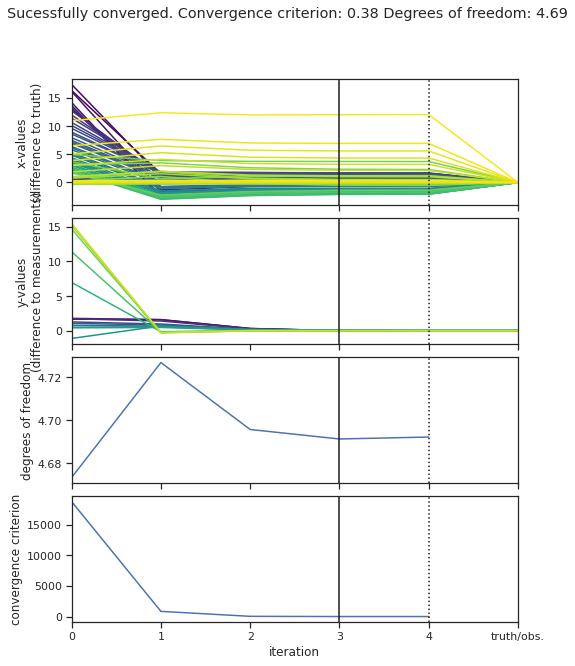

In [18]:
percents_remove = np.linspace(0,1,101)[:-2]
rms_y_percents = []
for percent_remove in percents_remove:
    # prior_qts

    x_cov = []
    x_mean = []

    for season in ['all'] + seasons:
        prior_qts_sampled =  prior_qts[season].sample(n=int(len(prior_qts[season])*(1-percent_remove)))
        x_cov1 = prior_qts_sampled.cov().rename_axis('state', axis=0).rename_axis('stateT', axis=1)
        x_mean1 = prior_qts_sampled.mean().rename_axis('state', axis=0)

        x_cov.append(xr.DataArray(x_cov1))
        x_mean.append(xr.DataArray(x_mean1))

    x_cov = xr.concat(x_cov, dim='season')
    x_mean = xr.concat(x_mean, dim='season')

    x_cov['season'] = ['all'] + seasons
    x_mean['season'] = ['all'] + seasons

    for season in x_cov.season:
        assert np.linalg.matrix_rank(x_cov.sel(season=season).to_pandas()) ==  x_cov.shape[-1]
        
    height = priors['all'].height

    pressure = []
    for k in ['all'] + seasons:
        pressure.append(priors[k].bar_pres.mean('time'))
    pressure = xr.concat(pressure, dim='season')
    pressure['season'] = ['all'] + seasons
    pressure = pressure.to_pandas()

    profiles_t = profiles['temp'].to_pandas()
    profiles_t.columns = ['%05i_t' % (i) for i in profiles_t.columns]
    profiles_q = profiles['q'].to_pandas()
    profiles_q.columns = ['%05i_q' % (i) for i in profiles_q.columns]

    x_truths = pn.concat((profiles_t, profiles_q), 1)
    x_truths = x_truths.reindex(sorted(x_truths.index), axis=0)
    x_truths.columns.name = 'state'
    x_truths.index.name = 'time'

    assert np.all(np.isfinite(x_truths))

    frequencies = [
        22.24, 23.04, 23.84, 25.44, 26.24, 27.84, 31.4, 51.26, 52.28, 53.86, 54.94,
        56.66, 57.3, 58.
    ]

    y_vars = np.array(frequencies)
    x_vars = x_mean.state.values

    season = Xa_season  #Spring: March April May
    profile = np.datetime64(Yobs_time)
    x_truth = x_truths.loc[profile]

    y_noise = pn.Series(
        [
            0.12026637, 0.10864162, 0.10412012, 0.0918477, 0.10174478, 0.10085633,
            0.10500476, 0.42303663, 0.45658514, 0.26291823, 0.25538793, 0.1773584,
            0.17556195, 0.59489495
        ],
        index=y_vars
    )

    S_y = pn.DataFrame(
        np.diag(y_noise.values**2),
        index=y_vars,
        columns=y_vars,
    )

    x_a = x_mean.sel(season=Xa_season).to_pandas()[x_vars]
    S_a = x_cov.sel(season=Xa_season).to_pandas().loc[x_vars, x_vars]

    try:
        pyOE.invertMatrix(singularMatrix)
    except Exception as err:
        traceback.print_tb(err.__traceback__)
        
    forwardKwArgs = dict(
        pressure=pressure.loc[Xa_season].values,
        zenithAngle=0,
        frequencies=frequencies
    )

    y_obs = forwardRT(x_truth, **forwardKwArgs)
    y_obs = pn.Series(y_obs, index=y_vars)
    assert np.all(np.isfinite(y_obs))

    oe_ref = pyOE.optimalEstimation(
        x_vars, # state variable names
        x_a,  # a priori
        S_a, # a priori uncertainty
        y_vars,  # measurement variable names
        y_obs, # observations
        S_y, # observation uncertainty
        forwardRT, # forward Operator
        forwardKwArgs=forwardKwArgs, # additonal function arguments
        x_truth=x_truth, # true profile
    )

    oe_ref.doRetrieval()

    fig = supporting_routines.plotMwrResults(
        oe_ref,
        h=pressure.loc[season] / 100,
        hlabel='Pressure [hPa]',
        title=str(round(percent_remove*100))+' percent removal')
    fig.savefig('output/figures_q1_percent/'+'result_'+str(round(percent_remove*100))+'_percent_removal')

    fig = oe_ref.plotIterations(legend=False, mode='difference')
    fig.savefig('output/figures_q1_percent/'+'iteration_'+str(round(percent_remove*100))+'_percent_removal')

    T_optimal, Q_optimal = supporting_routines.splitTQ(oe_ref.x_op)
    T_truth, Q_truth = supporting_routines.splitTQ(oe_ref.x_truth)
    rms_y_percents.append(np.sqrt(np.mean((oe_ref.y_obs - oe_ref.y_op)**2)))

    # print('RMS X Temperature: %g [K]'% np.sqrt(np.mean((T_optimal - T_truth)**2)))
    # print('RMS X Humidity: %g [log$_{10}$(g/kg)]'% np.sqrt(np.mean((10**Q_optimal - 10**Q_truth)**2)))
    # print('RMS Y %g [K]'% np.sqrt(np.mean((oe_ref.y_obs - oe_ref.y_op)**2)))

/tmp/ipykernel_3952857/669199043.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['{:,.2%}'.format(x) for x in vals])


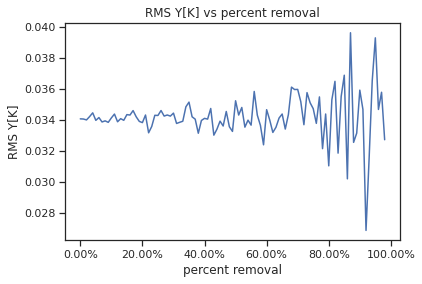

,percent removal (%),rms
0,0.0,0.034057
1,1.0,0.034047
2,2.0,0.033989
3,3.0,0.034204
4,4.0,0.034446
...,...,...
94,94.0,0.036519
95,95.0,0.039287
96,96.0,0.034664
97,97.0,0.035774


In [22]:
fig, ax = plt.subplots()
ax.plot(percents_remove, rms_y_percents)
ax.set_title('RMS Y[K] vs percent removal')
ax.set_xlabel('percent removal')
ax.set_ylabel('RMS Y[K]')
# manipulate
vals = ax.get_xticks()
ax.set_xticklabels(['{:,.2%}'.format(x) for x in vals])
fig.savefig('output/'+'rms_percent_removal')
plt.show()
df_percent_removal = pn.DataFrame( {'percent removal (%)':np.array(percents_remove)*100, 'rms':np.array(rms_y_percents)})
df_percent_removal.to_csv('output/rms_percent_removal.csv', header=False)  
df_percent_removal

/tmp/ipykernel_3952857/1299514848.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1299514848.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.69 s, iteration 1, degrees of freedom: 4.73 of 120, not converged (x-space):  805.021
1.03 s, iteration 2, degrees of freedom: 4.70 of 120, not converged (x-space):  32.848
1.38 s, iteration 3, degrees of freedom: 4.70 of 120, converged (x-space):  0.323
1.72 s, iteration 4, degrees of freedom: 4.70 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1299514848.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1299514848.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.61 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  770.959
0.91 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  31.120
1.21 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.291
1.51 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1299514848.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1299514848.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.74 of 120, not converged (x-space):  811.990
0.90 s, iteration 2, degrees of freedom: 4.71 of 120, not converged (x-space):  33.141
1.20 s, iteration 3, degrees of freedom: 4.70 of 120, converged (x-space):  0.330
1.50 s, iteration 4, degrees of freedom: 4.70 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)
/tmp/ipykernel_3952857/1299514848.py:40: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x_truths = pn.concat((profiles_t, profiles_q), 1)
  File "/tmp/ipykernel_3952857/1299514848.py", line 78, in <cell line: 3>
    pyOE.invertMatrix(singularMatrix)


0.60 s, iteration 1, degrees of freedom: 4.71 of 120, not converged (x-space):  776.982
0.90 s, iteration 2, degrees of freedom: 4.68 of 120, not converged (x-space):  31.305
1.20 s, iteration 3, degrees of freedom: 4.68 of 120, converged (x-space):  0.293
1.51 s, iteration 4, degrees of freedom: 4.68 of 120, done.  0.001


/home/microway/anaconda3/lib/python3.9/site-packages/pyOptimalEstimation/pyOEcore.py:1339: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp4.set_xticklabels(xlabels)


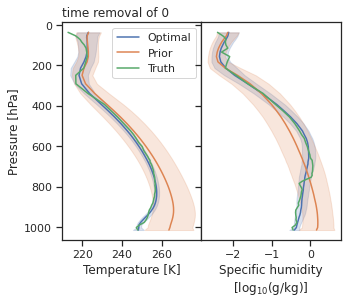

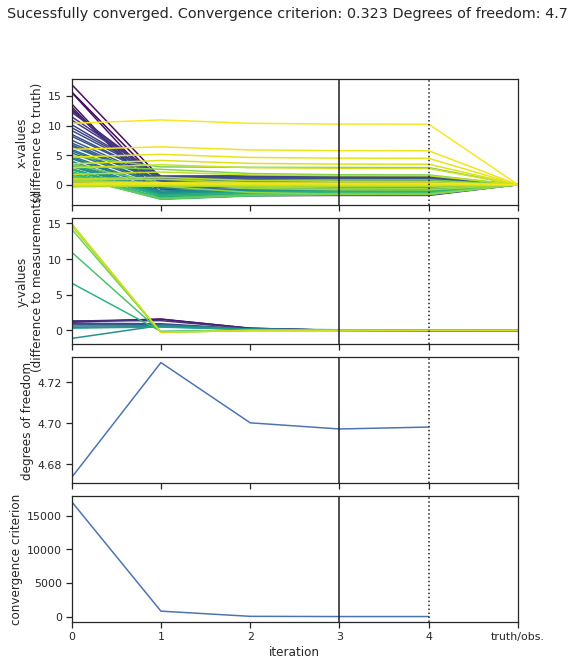

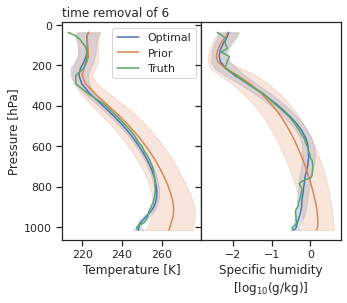

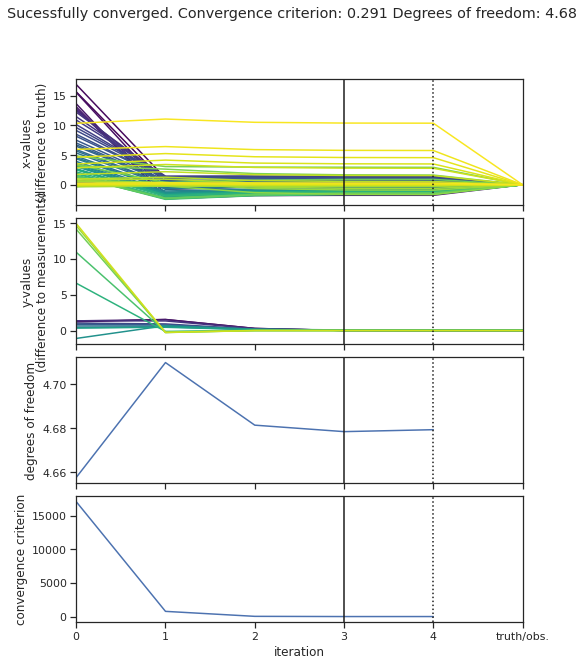

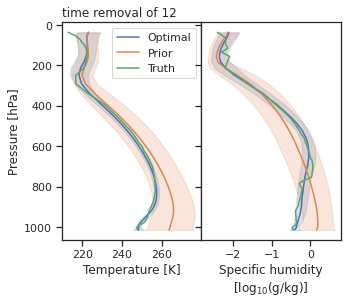

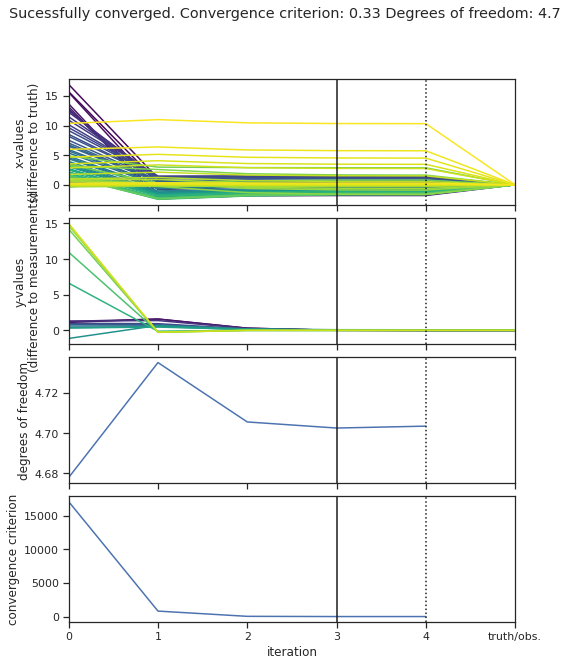

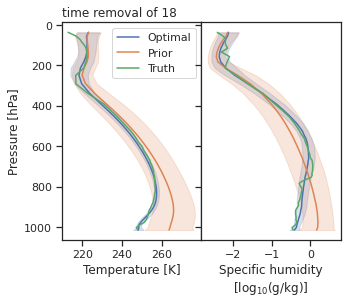

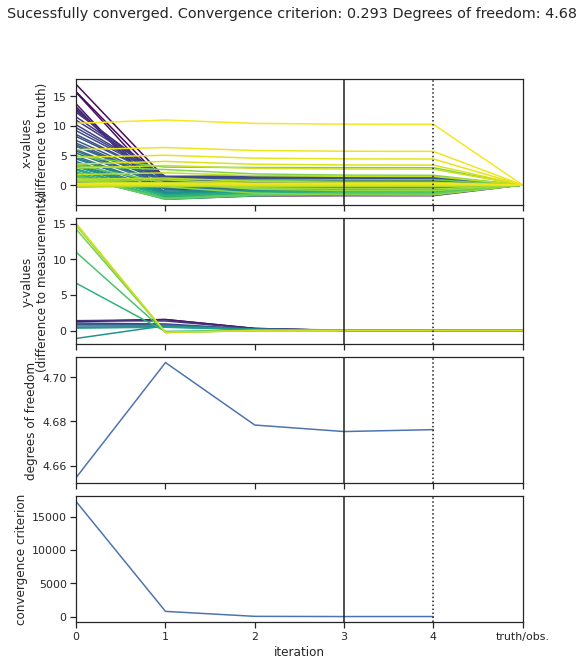

In [23]:
times_remove = [0, 6, 12, 18]
rms_y = []
for time_remove in times_remove:
    # prior_qts

    x_cov = []
    x_mean = []

    for season in ['all'] + seasons:
        prior_qts_sampled =  prior_qts[season][prior_qts[season].index.hour != time_remove]
        x_cov1 = prior_qts_sampled.cov().rename_axis('state', axis=0).rename_axis('stateT', axis=1)
        x_mean1 = prior_qts_sampled.mean().rename_axis('state', axis=0)

        x_cov.append(xr.DataArray(x_cov1))
        x_mean.append(xr.DataArray(x_mean1))

    x_cov = xr.concat(x_cov, dim='season')
    x_mean = xr.concat(x_mean, dim='season')

    x_cov['season'] = ['all'] + seasons
    x_mean['season'] = ['all'] + seasons

    for season in x_cov.season:
        assert np.linalg.matrix_rank(x_cov.sel(season=season).to_pandas()) ==  x_cov.shape[-1]
        
    height = priors['all'].height

    pressure = []
    for k in ['all'] + seasons:
        pressure.append(priors[k].bar_pres.mean('time'))
    pressure = xr.concat(pressure, dim='season')
    pressure['season'] = ['all'] + seasons
    pressure = pressure.to_pandas()

    profiles_t = profiles['temp'].to_pandas()
    profiles_t.columns = ['%05i_t' % (i) for i in profiles_t.columns]
    profiles_q = profiles['q'].to_pandas()
    profiles_q.columns = ['%05i_q' % (i) for i in profiles_q.columns]

    x_truths = pn.concat((profiles_t, profiles_q), 1)
    x_truths = x_truths.reindex(sorted(x_truths.index), axis=0)
    x_truths.columns.name = 'state'
    x_truths.index.name = 'time'

    assert np.all(np.isfinite(x_truths))

    frequencies = [
        22.24, 23.04, 23.84, 25.44, 26.24, 27.84, 31.4, 51.26, 52.28, 53.86, 54.94,
        56.66, 57.3, 58.
    ]

    y_vars = np.array(frequencies)
    x_vars = x_mean.state.values

    season = Xa_season  #Spring: March April May
    profile = np.datetime64(Yobs_time)
    x_truth = x_truths.loc[profile]

    y_noise = pn.Series(
        [
            0.12026637, 0.10864162, 0.10412012, 0.0918477, 0.10174478, 0.10085633,
            0.10500476, 0.42303663, 0.45658514, 0.26291823, 0.25538793, 0.1773584,
            0.17556195, 0.59489495
        ],
        index=y_vars
    )

    S_y = pn.DataFrame(
        np.diag(y_noise.values**2),
        index=y_vars,
        columns=y_vars,
    )

    x_a = x_mean.sel(season=Xa_season).to_pandas()[x_vars]
    S_a = x_cov.sel(season=Xa_season).to_pandas().loc[x_vars, x_vars]

    try:
        pyOE.invertMatrix(singularMatrix)
    except Exception as err:
        traceback.print_tb(err.__traceback__)
        
    forwardKwArgs = dict(
        pressure=pressure.loc[Xa_season].values,
        zenithAngle=0,
        frequencies=frequencies
    )

    y_obs = forwardRT(x_truth, **forwardKwArgs)
    y_obs = pn.Series(y_obs, index=y_vars)
    assert np.all(np.isfinite(y_obs))

    oe_ref = pyOE.optimalEstimation(
        x_vars, # state variable names
        x_a,  # a priori
        S_a, # a priori uncertainty
        y_vars,  # measurement variable names
        y_obs, # observations
        S_y, # observation uncertainty
        forwardRT, # forward Operator
        forwardKwArgs=forwardKwArgs, # additonal function arguments
        x_truth=x_truth, # true profile
    )

    oe_ref.doRetrieval()

    fig = supporting_routines.plotMwrResults(
        oe_ref,
        h=pressure.loc[season] / 100,
        hlabel='Pressure [hPa]',
        title='time removal of '+str(time_remove))
    fig.savefig('output/figures_q1_time/result_time_removal_'+str(time_remove))

    fig = oe_ref.plotIterations(legend=False, mode='difference')
    fig.savefig('output/figures_q1_time/iteration_time_removal_'+str(time_remove))

    T_optimal, Q_optimal = supporting_routines.splitTQ(oe_ref.x_op)
    T_truth, Q_truth = supporting_routines.splitTQ(oe_ref.x_truth)
    rms_y.append(np.sqrt(np.mean((oe_ref.y_obs - oe_ref.y_op)**2)))

    # print('RMS X Temperature: %g [K]'% np.sqrt(np.mean((T_optimal - T_truth)**2)))
    # print('RMS X Humidity: %g [log$_{10}$(g/kg)]'% np.sqrt(np.mean((10**Q_optimal - 10**Q_truth)**2)))
    # print('RMS Y %g [K]'% np.sqrt(np.mean((oe_ref.y_obs - oe_ref.y_op)**2)))

In [24]:
df_time_removal = pn.DataFrame( {'times removal':times_remove, 'rms':rms_y})
df_time_removal.to_csv('output/rms_time_removal.csv', header=False)  
df_time_removal

,times removal,rms
0,0,0.034767
1,6,0.033130
2,12,0.034818
3,18,0.033407
